# Resizing Parameter Testing Sample

Create 16 sample resized images for testing, 4 from each class

Test blur and other parameters

In [8]:
# Packages
import pandas as pd
import os
import shutil
import time
import matplotlib.pyplot as plt

# Importing the image processing functions
from Image_Resizing_Functions import *

## Load Data

In [9]:
# Load dataframe "../../../Data/resized_cars_annos.xlsx"
resized_cars_annos = pd.read_excel("../../../Data/resized_cars_annos.xlsx")
resized_cars_annos

,Class,old_class_name,orig_width,orig_height,test_80_20,orig_res_file_path,parameter_testing_destination_file_name,blurred_destination_file_name,no_blur_destination_file_name
0,SUV,AM General Hummer SUV 2000,800,600,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_test_01117_resized.jpg,SUV_train_orig_test_01117_resized_blurred.jpg,SUV_train_orig_test_01117_resized_no_blur.jpg
1,SUV,AM General Hummer SUV 2000,800,520,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_test_01518_resized.jpg,SUV_train_orig_test_01518_resized_blurred.jpg,SUV_train_orig_test_01518_resized_no_blur.jpg
2,SUV,AM General Hummer SUV 2000,500,353,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_test_01538_resized.jpg,SUV_train_orig_test_01538_resized_blurred.jpg,SUV_train_orig_test_01538_resized_no_blur.jpg
3,SUV,AM General Hummer SUV 2000,786,491,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_test_01802_resized.jpg,SUV_train_orig_test_01802_resized_blurred.jpg,SUV_train_orig_test_01802_resized_no_blur.jpg
4,SUV,AM General Hummer SUV 2000,800,580,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_test_01887_resized.jpg,SUV_train_orig_test_01887_resized_blurred.jpg,SUV_train_orig_test_01887_resized_no_blur.jpg
...,...,...,...,...,...,...,...,...,...
8247,Convertible,smart fortwo Convertible 2012,630,420,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_train_07500_resized.jpg,Convertible_train_orig_train_07500_resized_blu...,Convertible_train_orig_train_07500_resized_no_...
8248,Convertible,smart fortwo Convertible 2012,400,300,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_train_07594_resized.jpg,Convertible_train_orig_train_07594_resized_blu...,Convertible_train_orig_train_07594_resized_no_...
8249,Convertible,smart fortwo Convertible 2012,1024,683,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_train_07846_resized.jpg,Convertible_train_orig_train_07846_resized_blu...,Convertible_train_orig_train_07846_resized_no_...
8250,Convertible,smart fortwo Convertible 2012,500,272,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_train_07895_resized.jpg,Convertible_train_orig_train_07895_resized_blu...,Convertible_train_orig_train_07895_resized_no_...


## Draw Images from Training Set

In [10]:
# Set seed to 290
import random
random.seed(290)

# Sample 4 from each Class
resizing_sample = resized_cars_annos[resized_cars_annos['test_80_20'] == 0].groupby('Class').apply(lambda x: x.sample(4)).reset_index(drop=True)
resizing_sample

,Class,old_class_name,orig_width,orig_height,test_80_20,orig_res_file_path,parameter_testing_destination_file_name,blurred_destination_file_name,no_blur_destination_file_name
0,Convertible,Ferrari 458 Italia Convertible 2012,585,362,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_train_06688_resized.jpg,Convertible_train_orig_train_06688_resized_blu...,Convertible_train_orig_train_06688_resized_no_...
1,Convertible,BMW 1 Series Convertible 2012,480,360,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_test_04148_resized.jpg,Convertible_train_orig_test_04148_resized_blur...,Convertible_train_orig_test_04148_resized_no_b...
2,Convertible,Chrysler Sebring Convertible 2010,400,300,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_train_00218_resized.jpg,Convertible_train_orig_train_00218_resized_blu...,Convertible_train_orig_train_00218_resized_no_...
3,Convertible,Bentley Continental Supersports Conv. Converti...,1345,762,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,Convertible_train_orig_train_01792_resized.jpg,Convertible_train_orig_train_01792_resized_blu...,Convertible_train_orig_train_01792_resized_no_...
4,Pickup,Chevrolet Silverado 1500 Extended Cab 2012,1600,1067,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,Pickup_train_orig_test_01553_resized.jpg,Pickup_train_orig_test_01553_resized_blurred.jpg,Pickup_train_orig_test_01553_resized_no_blur.jpg
5,Pickup,Chevrolet Silverado 1500 Regular Cab 2012,1024,768,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,Pickup_train_orig_train_00957_resized.jpg,Pickup_train_orig_train_00957_resized_blurred.jpg,Pickup_train_orig_train_00957_resized_no_blur.jpg
6,Pickup,Chevrolet Silverado 1500 Regular Cab 2012,1024,768,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,Pickup_train_orig_test_00121_resized.jpg,Pickup_train_orig_test_00121_resized_blurred.jpg,Pickup_train_orig_test_00121_resized_no_blur.jpg
7,Pickup,Ford F-150 Regular Cab 2012,500,375,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,Pickup_train_orig_train_02093_resized.jpg,Pickup_train_orig_train_02093_resized_blurred.jpg,Pickup_train_orig_train_02093_resized_no_blur.jpg
8,SUV,HUMMER H3T Crew Cab 2010,450,299,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_train_02385_resized.jpg,SUV_train_orig_train_02385_resized_blurred.jpg,SUV_train_orig_train_02385_resized_no_blur.jpg
9,SUV,GMC Terrain SUV 2012,625,468,0,~/Box/INFO 290T Project/Intermediate Data/Sele...,SUV_train_orig_train_01882_resized.jpg,SUV_train_orig_train_01882_resized_blurred.jpg,SUV_train_orig_train_01882_resized_no_blur.jpg


## Setup Sample Runs

In [11]:
# Function for Sample runs
def sample_run(run_name = 'Defaults', blur = True, blur_sigma = 0.75, target_size = 256, display_images = True, timer = True):

    # Change destination file path
    resizing_sample['destination_file_path'] = "../../../Images/resizing parameter testing sample/" + run_name + "/" + resizing_sample['parameter_testing_destination_file_name']

    # Clear the folder
    shutil.rmtree("../../../Images/resizing parameter testing sample/" + run_name, ignore_errors=True)
    os.makedirs("../../../Images/resizing parameter testing sample/"+ run_name, exist_ok=True)

    # Start the timer
    if timer:
        sample_start_time = time.time()
    
    # Iterate through the sample and process each image
    for _, row in resizing_sample.iterrows():
        image_resizing_read_write(row['orig_res_file_path'], row['destination_file_path'], blur = blur, blur_sigma = blur_sigma, target_size = target_size)

    # Display images if display_images is True
    if display_images:
        for _, row in resizing_sample.iterrows():
            display_img = plt.imread(os.path.expanduser(row['destination_file_path']))
            plt.imshow(display_img)
            plt.show()

    # End the timer
    if timer:
        # End timing run
        sample_end_time = time.time()
        # Sample time taken in minutes
        sample_time_taken = (sample_end_time - sample_start_time) / 60
        print('Sample time taken: ', sample_time_taken, ' minutes')

### Preferred/Default Settings: Blur with Sigma 0.75, Target Size 256x256

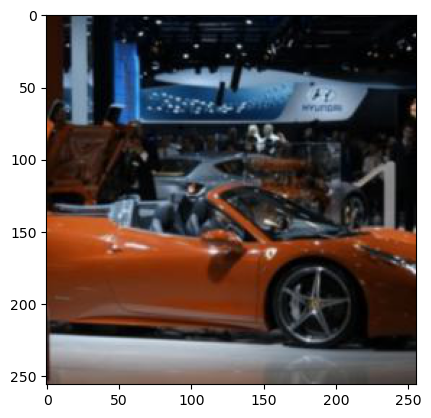

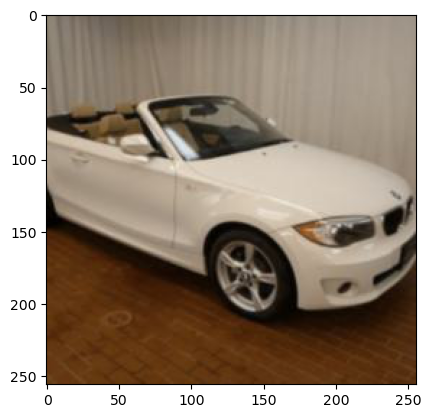

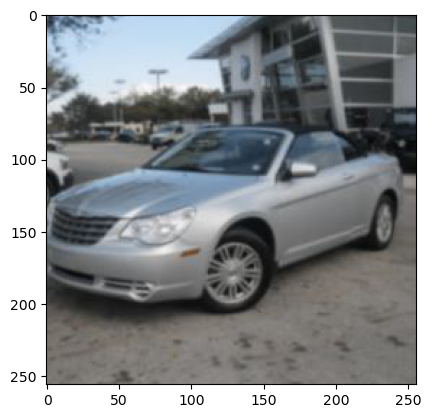

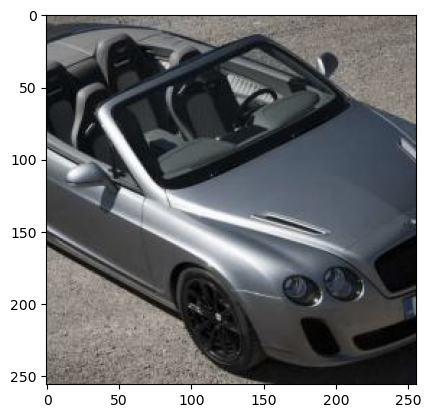

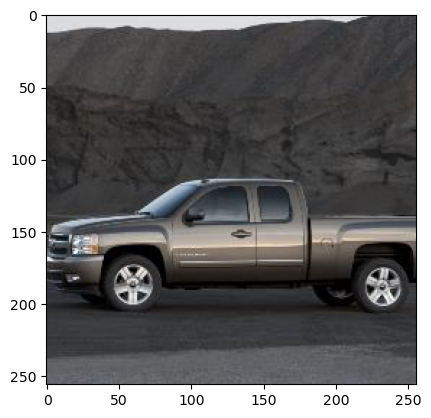

...

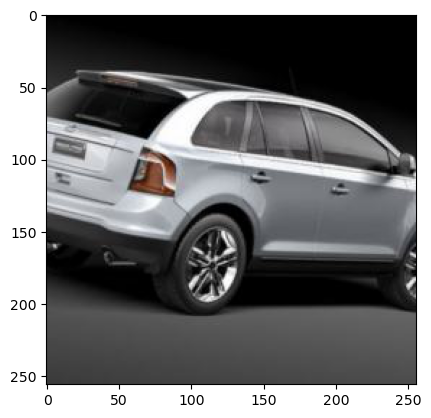

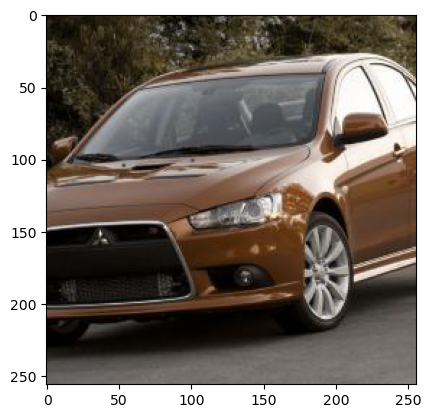

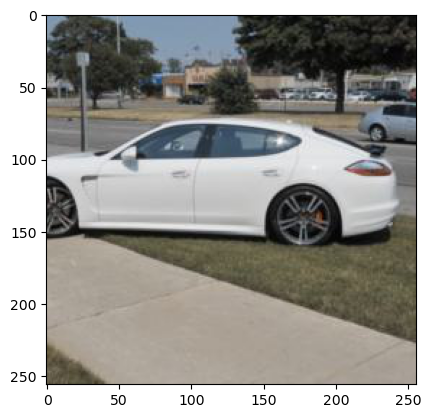

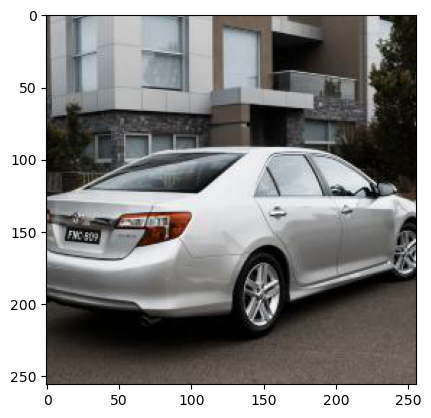

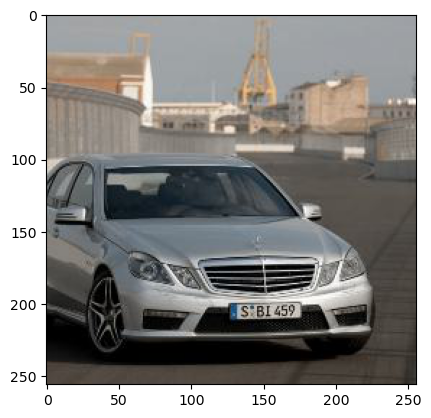

Sample time taken:  0.04350440502166748  minutes


In [12]:
sample_run(run_name = 'Defaults', blur = True, blur_sigma = 0.75, target_size = 256, timer = True)

### Blur with Sigma 0.5, Target Size 256x256

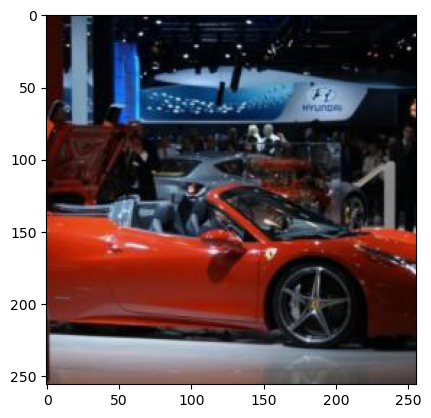

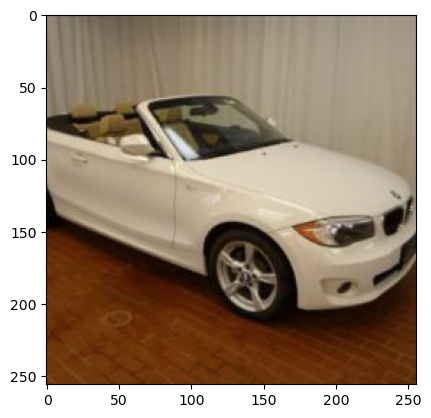

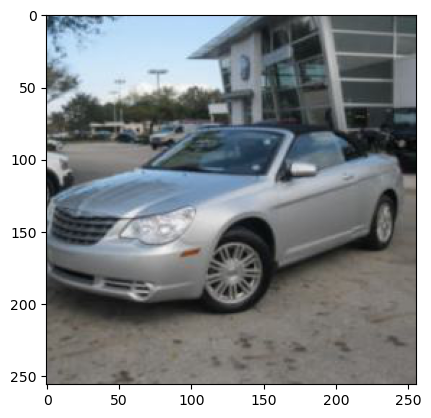

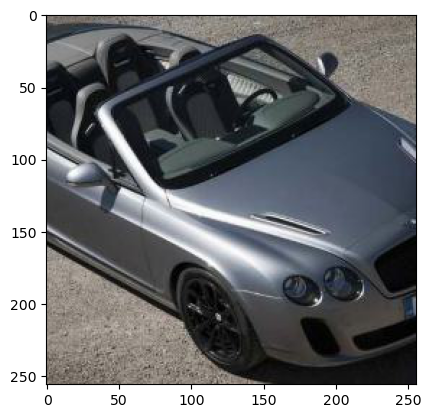

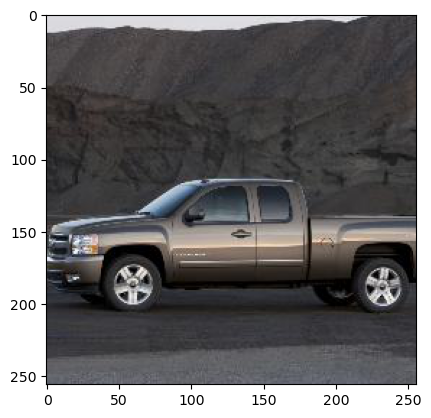

...

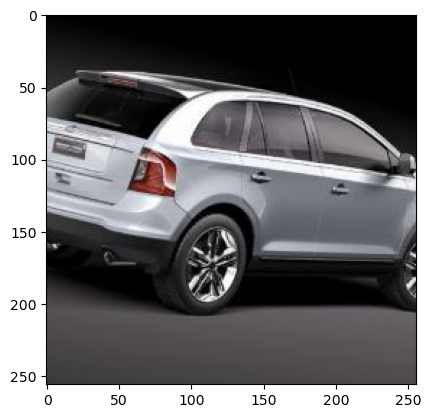

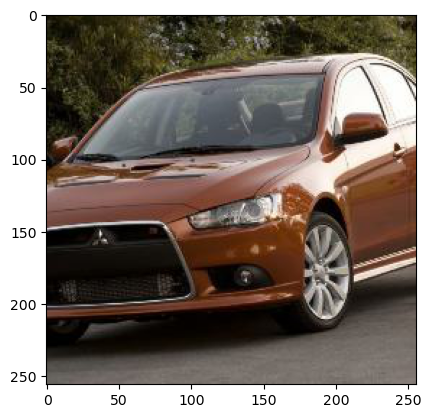

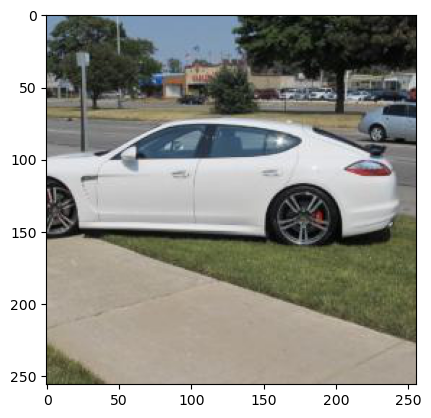

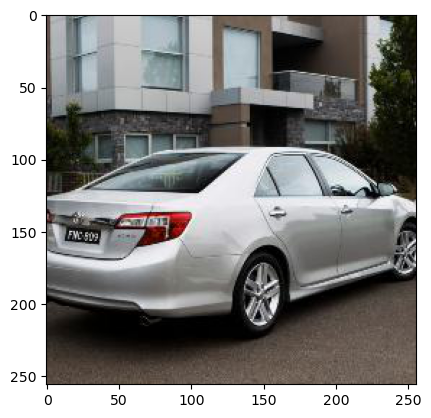

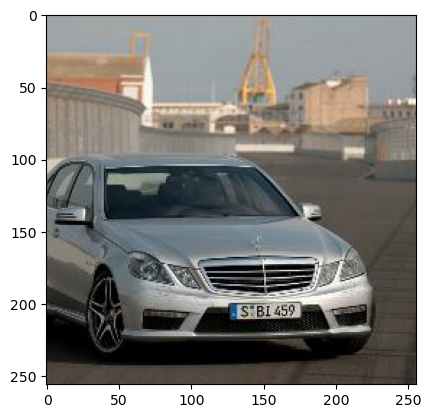

In [13]:
sample_run(run_name = 'Sigma 0 5', blur = True, blur_sigma = 0.5, target_size = 256, timer = False)

### Blur with Sigma 0.25, Target Size 256x256

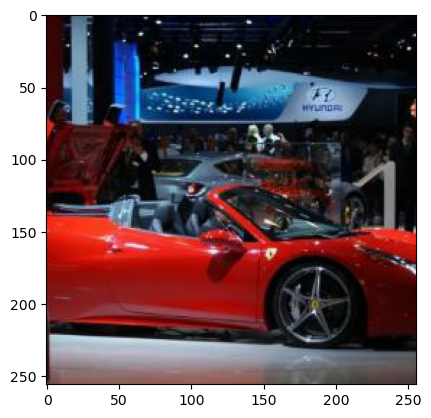

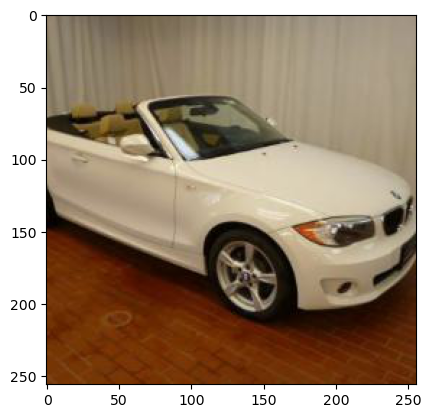

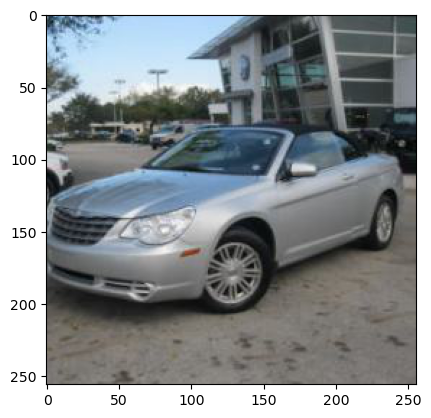

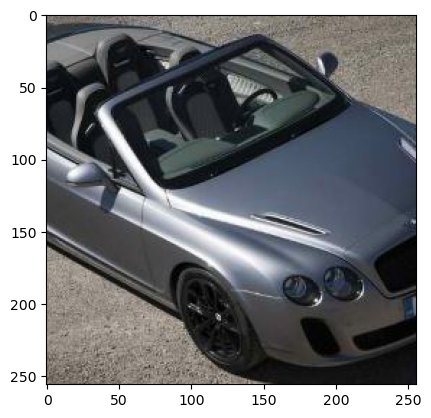

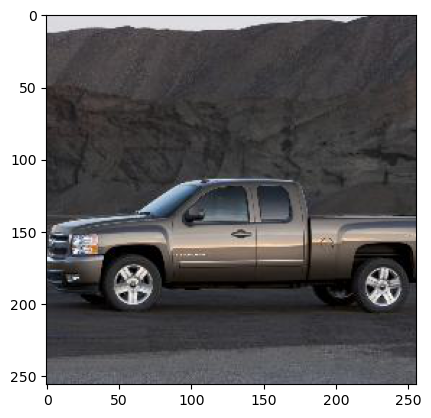

...

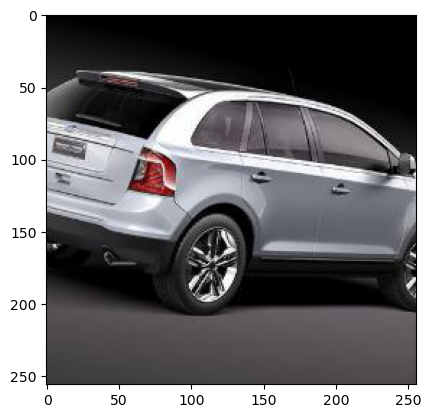

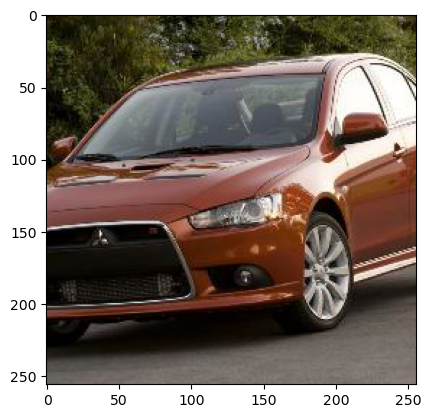

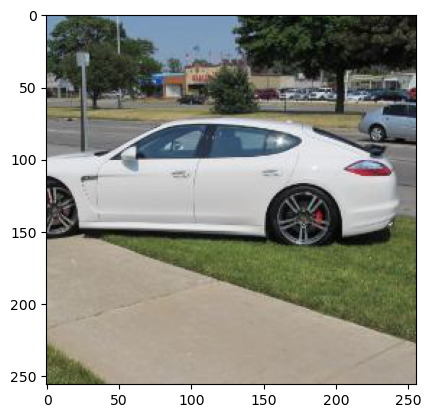

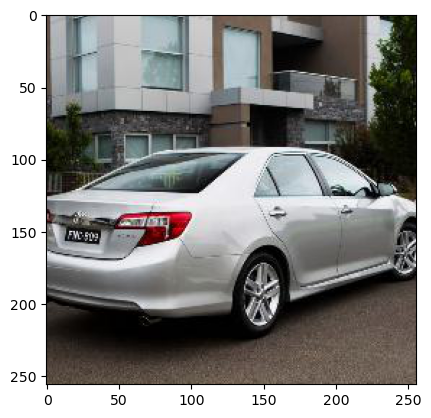

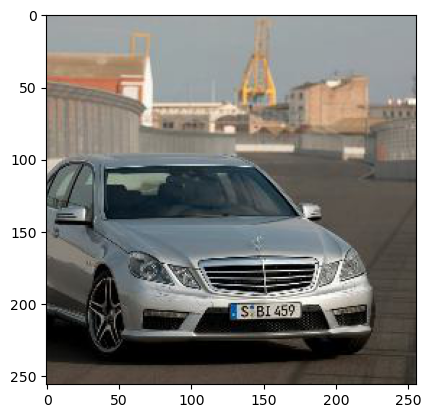

In [14]:
sample_run(run_name = 'Sigma 0 25', blur = True, blur_sigma = 0.25, target_size = 256, timer = False)

### Blur with Sigma 1, Target Size 256x256

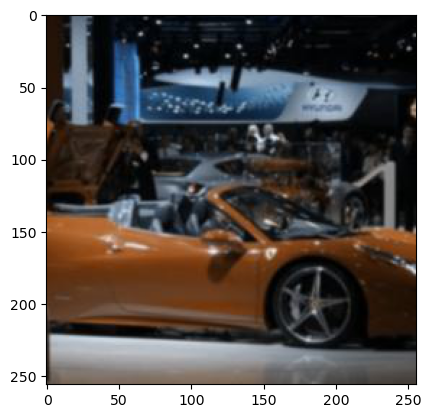

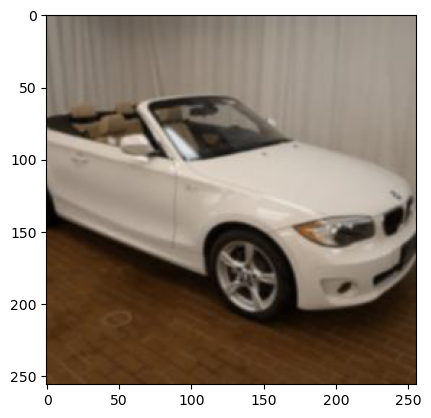

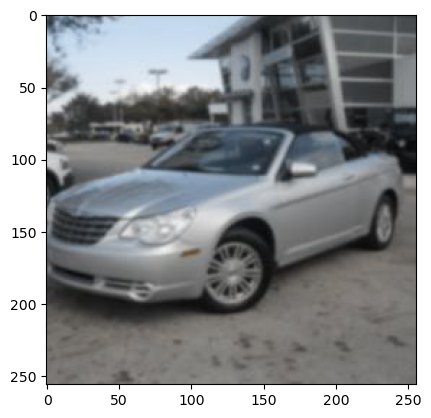

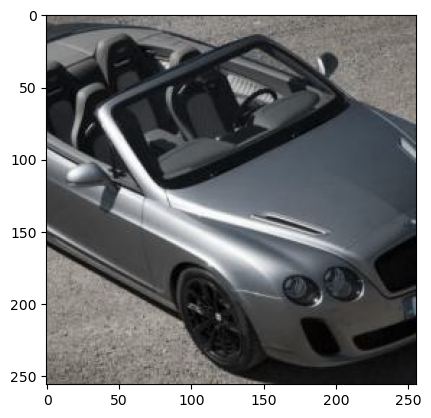

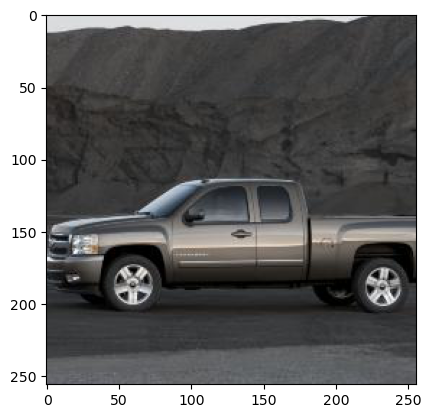

...

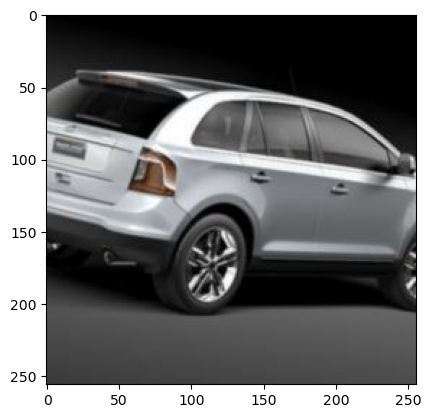

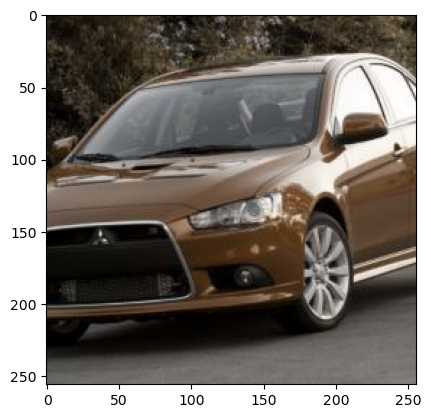

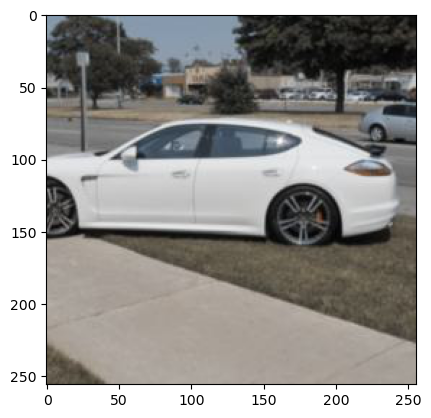

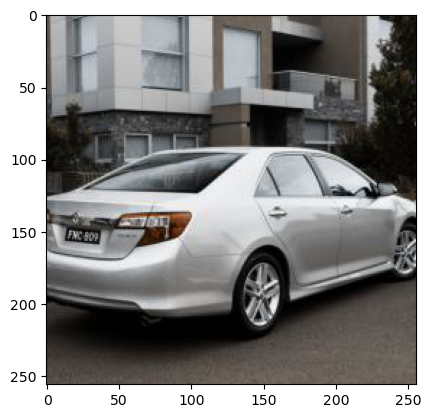

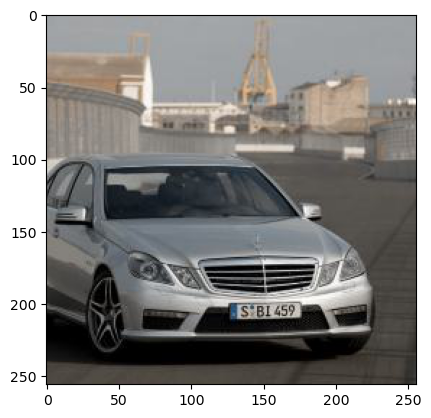

In [15]:
sample_run(run_name = 'Sigma 1', blur = True, blur_sigma = 1, target_size = 256, timer = False)

### No Blur, Target Size 256x256

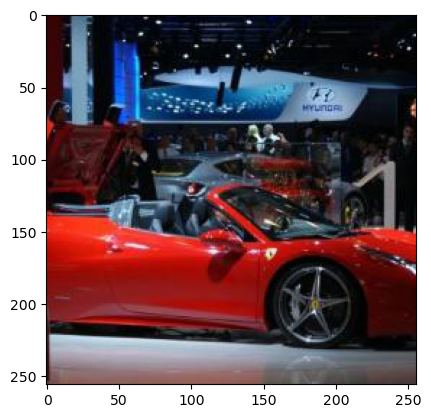

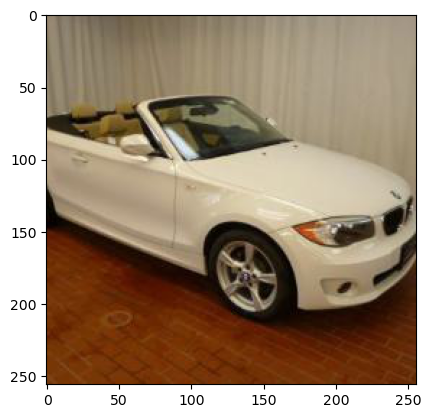

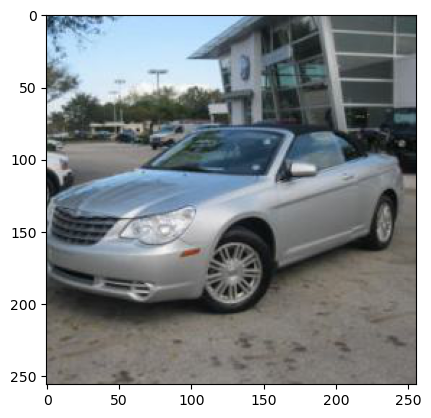

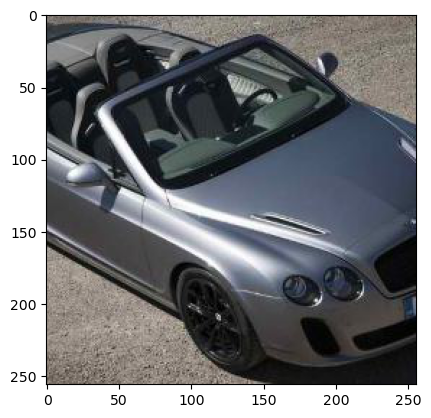

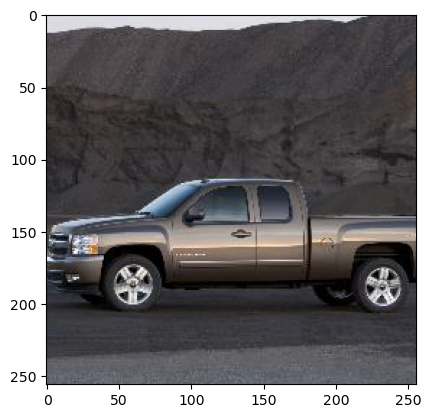

...

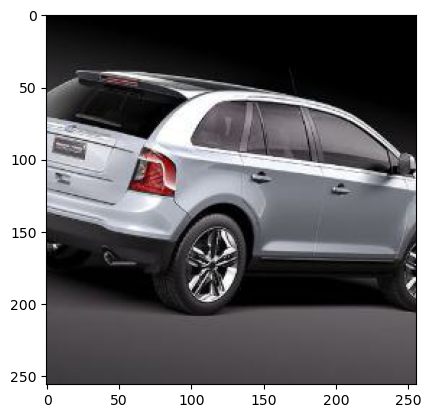

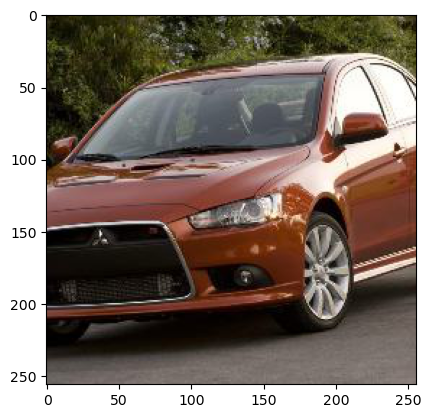

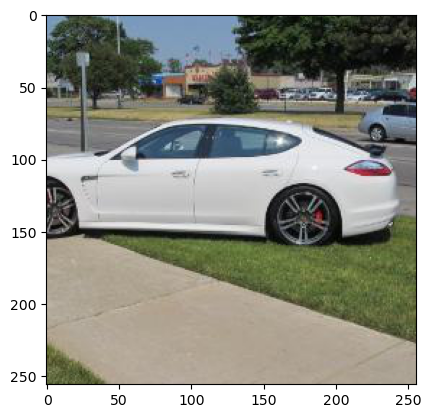

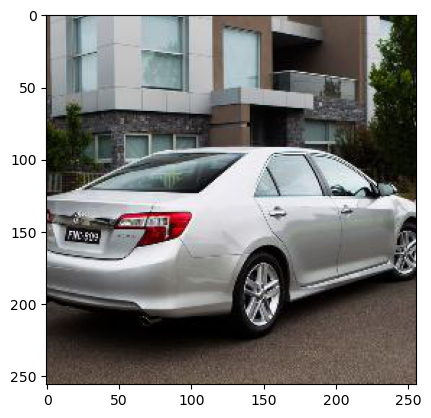

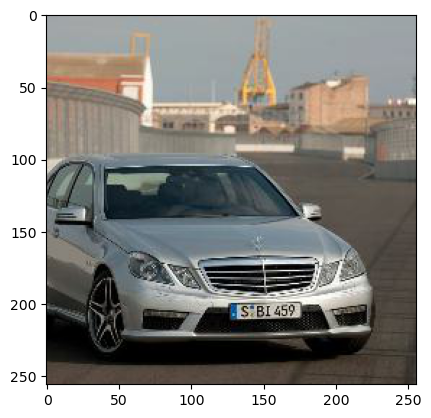

In [16]:
sample_run(run_name = 'No Blur', blur = False, target_size = 256, timer = False)
